In [1]:
using Plots; gr()
using DelimitedFiles
using LaTeXStrings
using PrettyTables
# using Base.Threads

include("stabilityFunctions.jl");
println("Number of threads: ", Threads.nthreads())

Number of threads: 1


In [2]:
# constants 

Bond = 1.5
b = 0.1
ϵ = 1 - Bond/2

c1 = c0(1, b, Bond); # wave speed at k = 1

In [4]:
# import matlab solutions 
solutions = readdlm("test & misc/matlab_solutions.csv", ',', Float64);

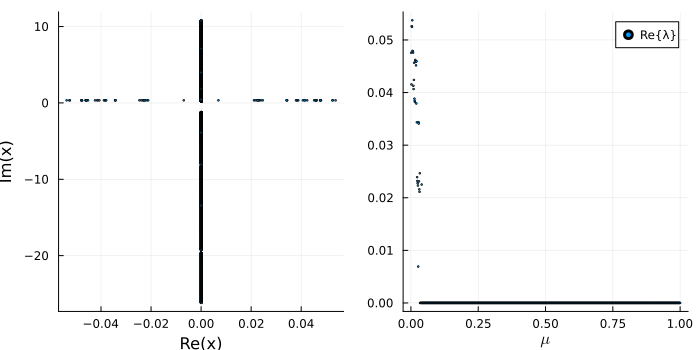

In [5]:
# compute eigenvalues λ
λ21000 = solveGenEig(solutions[40,:], 2, 1000)
stabilityPlots(λ21000, 1000)

In [6]:
solveGenEig(solutions[40,:], 8, 1000)

34×1000 Matrix{ComplexF64}:
   -0.0475863+0.33257im    -0.0415593+0.334896im  …   -3.13185e-8+62.943im
  -1.87802e-8+81.8824im   -9.78304e-8+81.8909im       -1.15052e-8+79.4109im
  -4.93518e-9-93.0343im   -6.03971e-8-128.823im       -1.10861e-8-103.055im
  -2.70347e-9+55.6848im   -3.25878e-8-114.1im          -6.0421e-9-93.023im
  -2.20855e-9-103.113im   -2.62516e-8-103.123im       -3.88565e-9-83.3149im
  -1.27911e-9-128.812im  -7.47818e-11-73.9597im   …   -1.42214e-9+48.7267im
  -1.27812e-9+48.7347im  -3.45376e-11+19.4573im       -1.12097e-9+42.1286im
 -3.48047e-10+35.8886im  -1.33464e-11-40.1355im      -4.14306e-10+1.82481im
 -1.54034e-10-56.2665im  -3.77986e-12-32.7063im      -4.08431e-10+10.6684im
 -1.25262e-10+30.0116im   -2.9464e-12+4.06521im      -3.03687e-10-64.9167im
             ⋮                                    ⋱  
  3.05872e-11+24.5247im   1.21329e-10+48.7415im   …   2.29536e-10-3.88824im
  6.16755e-11-64.9255im   1.46562e-10-64.9344im       2.71856e-10+7.07716im
  6.2103

In [7]:
# for i in 1:100
#     # solve for given solution
#     sol = solveGenEig(solutions[i,:], 12, 84500)

#     # save solution 
#     writedlm("stabilitySolutions2/$(i).12.84500.stabSol.csv", sol, ',')
# end

In [8]:
# load solution
sol = readdlm("stabilitySolutions2/1.12.84500.stabSol.csv", ',', Complex{Float64})

50×84500 Matrix{ComplexF64}:
   -1.0383e-6+113.132im    -6.01999e-7-171.286im  …  -3.78941e-5-221.276im
   -8.6707e-7-171.286im    -3.51854e-7+113.132im     -2.32389e-5+151.808im
   -4.3236e-8+104.101im    -2.59405e-7-159.424im     -6.36198e-7+131.965im
  -2.20737e-8-147.829im    -2.17052e-7+104.101im     -3.27408e-7+122.416im
  -1.93445e-8+78.651im     -6.51032e-8-136.51im      -6.18415e-8+4.0122im
  -1.04007e-8-125.475im    -5.40795e-8+86.8527im  …  -4.40171e-8+95.3299im
    -9.718e-9-114.731im    -5.86711e-9+78.6511im     -4.29235e-8+104.092im
  -8.48549e-9-221.29im     -4.84631e-9-114.731im     -1.63807e-8+78.643im
  -5.21542e-9+70.7427im    -2.59304e-9+70.7428im     -1.33586e-8-125.464im
 -8.89828e-10+0.332658im  -8.01774e-10+63.1373im      -6.6124e-9-13.6541im
             ⋮                                    ⋱  
   1.18115e-9+0.223166im    5.85849e-9-125.475im       4.4429e-8-147.818im
   2.21081e-8+95.3385im     8.73493e-7-183.41im       6.72088e-8+162.091im
   4.28132e-8-159.4

In [10]:
# stabilityPlotsGPU(sol, 84500)

### **Equilibrium Jet**

First consider the stability of a the ferrofluid jet at equilibrium $S(z) = 1$.

The eigenvalues of the spectral problem for the equilibrium case are given by:

$$\lambda_{\mu + m} = ic(\mu + m) \pm ic_0 (\mu + m)$$

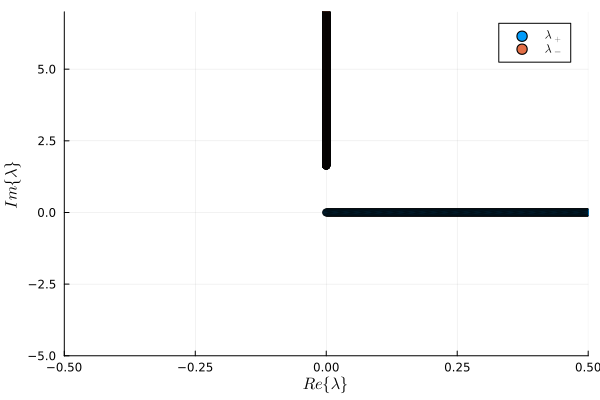

In [11]:
μ = collect(range(-1e-5, 10.0, 10000))
λ1, λ2 = λeq(μ, 1.0, c1, b, Bond)

# plotting 
scatter(real(λ1),imag(λ1), label=L"\lambda_+")
scatter!(real(λ2),imag(λ2), label=L"\lambda_-")

xlabel!(L"Re\{\lambda\}")
ylabel!(L"Im\{\lambda\}")

xlims!(-0.5,0.5)
ylims!(-5,7)

### **Collisions** 

Plotting the real part of $\lambda$ over the allowed values of the floquet parameter $\mu$ for various values of integer $m$ to visually look for collisions.

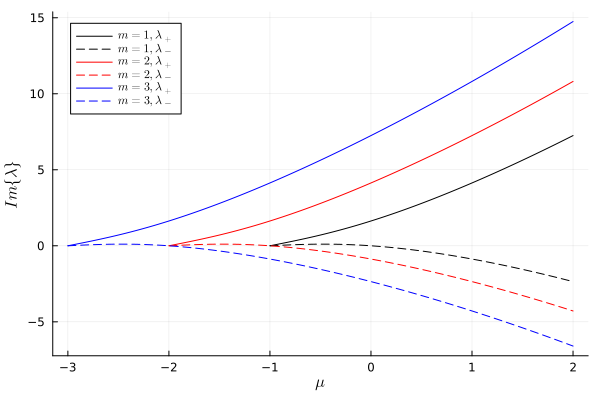

In [12]:
# define overall μ range
μ = collect(range(-10, 2, 10000))

# compute eq eigenvalues λ for m = 1 to 4
μ1, λ1₊, λ1₋ = λeq(μ, 1.0, c1, b, Bond)
μ2, λ2₊, λ2₋ = λeq(μ, 2.0, c1, b, Bond)
μ3, λ3₊, λ3₋ = λeq(μ, 3.0, c1, b, Bond)

# and also for m = -1, -2, -3, -4
μ1₋, λ1₊₋, λ1₋₋ = λeq(μ, -1.0, c1, b, Bond)
μ2₋, λ2₊₋, λ2₋₋ = λeq(μ, -2.0, c1, b, Bond)
μ3₋, λ3₊₋, λ3₋₋ = λeq(μ, -3.0, c1, b, Bond)

# plotting imaginary parts (solid lines for λ₊ and dashed lines for λ₋)
plot(μ1, imag(λ1₊), label=L"m = 1, \lambda_+", color=:black)
plot!(μ1, imag(λ1₋), label=L"m = 1, \lambda_-", color=:black, linestyle=:dash)

plot!(μ2, imag(λ2₊), label=L"m = 2, \lambda_+", color=:red)
plot!(μ2, imag(λ2₋), label=L"m = 2, \lambda_-", color=:red, linestyle=:dash)

plot!(μ3, imag(λ3₊), label=L"m = 3, \lambda_+", color=:blue)
plot!(μ3, imag(λ3₋), label=L"m = 3, \lambda_-", color=:blue, linestyle=:dash)


ylabel!(L"Im\{\lambda\}")
xlabel!(L"\mu")

# xlims!(-1.5,-0.5)

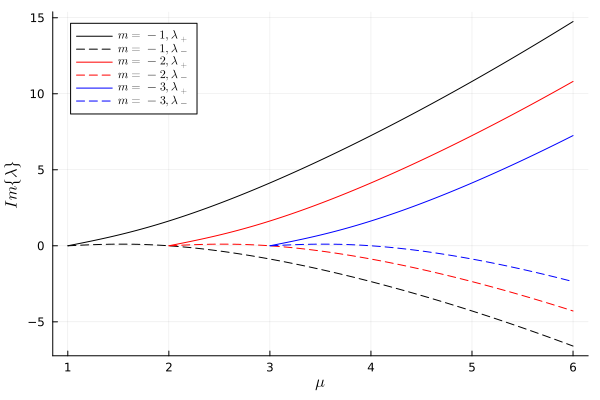

In [13]:
# now only look at range such that μ + m > 0 but m < 0

μ = collect(range(-10, 6, 10000))

μ1, λ1₊, λ1₋ = λeq(μ, -1.0, c1, b, Bond)
μ2, λ2₊, λ2₋ = λeq(μ, -2.0, c1, b, Bond)
μ3, λ3₊, λ3₋ = λeq(μ, -3.0, c1, b, Bond)

# plotting imaginary parts (solid lines for λ₊ and dashed lines for λ₋)
plot(μ1, imag(λ1₊), label=L"m = -1, \lambda_+", color=:black)
plot!(μ1, imag(λ1₋), label=L"m = -1, \lambda_-", color=:black, linestyle=:dash)

plot!(μ2, imag(λ2₊), label=L"m = -2, \lambda_+", color=:red)
plot!(μ2, imag(λ2₋), label=L"m = -2, \lambda_-", color=:red, linestyle=:dash)

plot!(μ3, imag(λ3₊), label=L"m = -3, \lambda_+", color=:blue)
plot!(μ3, imag(λ3₋), label=L"m = -3, \lambda_-", color=:blue, linestyle=:dash)

ylabel!(L"Im\{\lambda\}")
xlabel!(L"\mu")

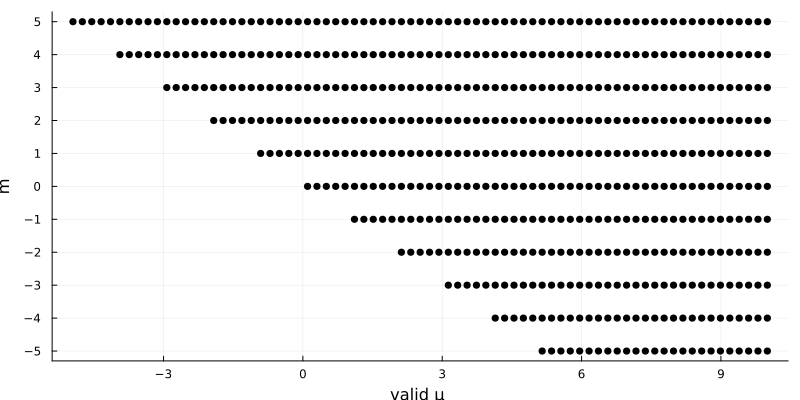

In [14]:
# Define the range of mu values and m values
mus = range(-10, stop=10, length=100)  # A range of mu values from -10 to 10
ms = -5:5  # m values from -5 to 5

# Prepare to plot
plot(size=(800, 400), xlabel= "valid μ ", ylabel="m")

# Add lines for each m value showing valid mu ranges
for m in ms
    valid_mus = mus[mus .+ m .>= 0]
    scatter!(valid_mus, fill(m, length(valid_mus)), color = :black)
end

plot!(legend = false)
yticks!(-5:1:5)

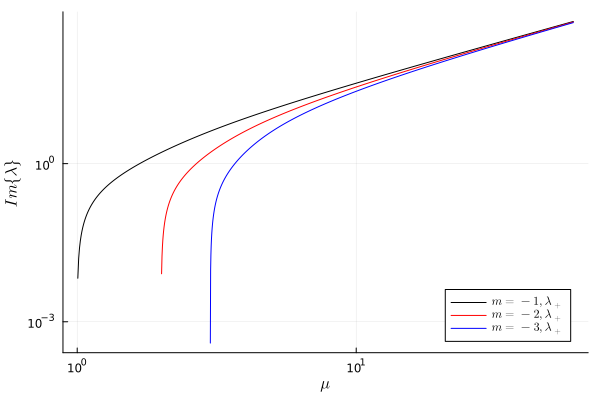

In [15]:
μ = collect(range(-10, 60, 10000))

μ1, λ1₊, λ1₋ = λeq(μ, -1.0, c1, b, Bond)
μ2, λ2₊, λ2₋ = λeq(μ, -2.0, c1, b, Bond)
μ3, λ3₊, λ3₋ = λeq(μ, -3.0, c1, b, Bond)

# plotting imaginary parts (solid lines for λ₊ and dashed lines for λ₋), log scale
plot(μ1, imag(λ1₊), label=L"m = -1, \lambda_+", color=:black, yaxis=:log10, xaxis=:log10)

plot!(μ2, imag(λ2₊), label=L"m = -2, \lambda_+", color=:red,  yaxis=:log10, xaxis=:log10)

plot!(μ3, imag(λ3₊), label=L"m = -3, \lambda_+", color=:blue,  yaxis=:log10, xaxis=:log10)

ylabel!(L"Im\{\lambda\}")
xlabel!(L"\mu")

# set legend to bottom right
plot!(legend = :bottomright)

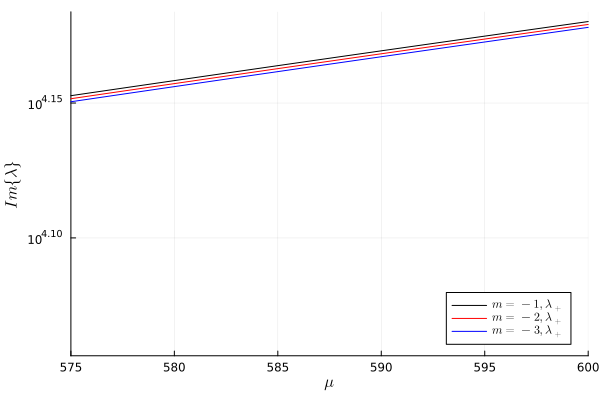

In [16]:
μ = collect(range(500, 600, 1000))

μ1, λ1₊, λ1₋ = λeq(μ, -1.0, c1, b, Bond)
μ2, λ2₊, λ2₋ = λeq(μ, -2.0, c1, b, Bond)
μ3, λ3₊, λ3₋ = λeq(μ, -3.0, c1, b, Bond)

# plotting imaginary parts (solid lines for λ₊ and dashed lines for λ₋), log scale
plot(μ1, imag(λ1₊), label=L"m = -1, \lambda_+", color=:black, yaxis=:log10)

plot!(μ2, imag(λ2₊), label=L"m = -2, \lambda_+", color=:red, yaxis=:log10)

plot!(μ3, imag(λ3₊), label=L"m = -3, \lambda_+", color=:blue, yaxis=:log10)

ylabel!(L"Im\{\lambda\}")
xlabel!(L"\mu")

xlims!(575, 600)
# ylims!(10^2+(10^2)*0.5, 10^3)

# set legend to bottom right
plot!(legend = :bottomright)

Plotting eigenvalues for a larger difference in m values.

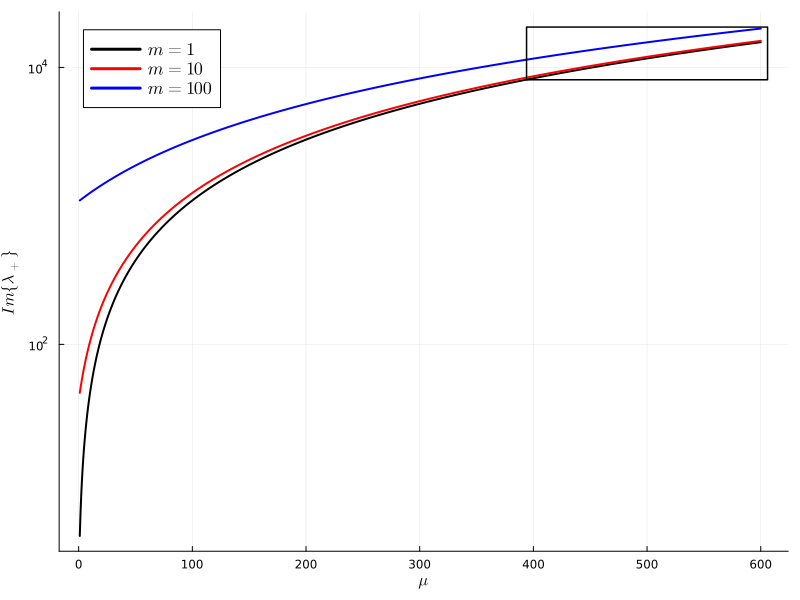

In [17]:
gr()
μ = collect(range(1, 600, 1000))

μ1, λ1₊, λ1₋ = λeq(μ, 1.0, c1, b, Bond)
μ2, λ2₊, λ2₋ = λeq(μ, 10.0, c1, b, Bond)
μ3, λ3₊, λ3₋ = λeq(μ, 100, c1, b, Bond)

# plotting imaginary parts (solid lines for λ₊ and dashed lines for λ₋), log scale
plot(μ1, imag(λ1₊), label=L"m = 1", color=:black, lw=2)
plot!(μ2, imag(λ2₊), label=L"m = 10", color=:red, lw=2)
plot!(μ3, imag(λ3₊), label=L"m = 100", color=:blue, lw=2)

ylabel!(L"Im\{\lambda_+\}")
xlabel!(L"\mu")

plot!(yaxis=:log10)
plot!(size=(800, 600))

# make legend text larger
plot!(legendfontsize=12)

# magnify region of the plot using lens! (from mu = 500 to 600)
# lens!(x=[300, 400], y=[10^3,10^4], inset = (1, bbox(0.7, 0.6, 0.3, 0.3)), ticks=false, subplot=2, framestyle=:box)
# lens!(x=[μ1[500:550]], y=[μ1[500:550]], inset = (1, bbox(0.5, 0.5, 0.2, 0.2)), ticks=true, subplot=2, framestyle=:box)
# lens!([μ1[500:550], μ2[500:550], μ3[500:550]], [imag(λ1₊[500:550]), imag(λ2₊[500:550]), imag(λ3₊[500:550])], inset = (1, bbox(0.5, 0.5, 0.4, 0.4)))

# draw a box around the lensed region (from mu = (394.0, 606.0) and Im(λ) = (8147.476135511601, 19563.452723111288)) with no label
plot!([394.0, 606.0, 606.0, 394.0, 394.0], [8147.476135511601, 8147.476135511601, 19563.452723111288, 19563.452723111288, 8147.476135511601], color=:black, lw=1.5, label="")


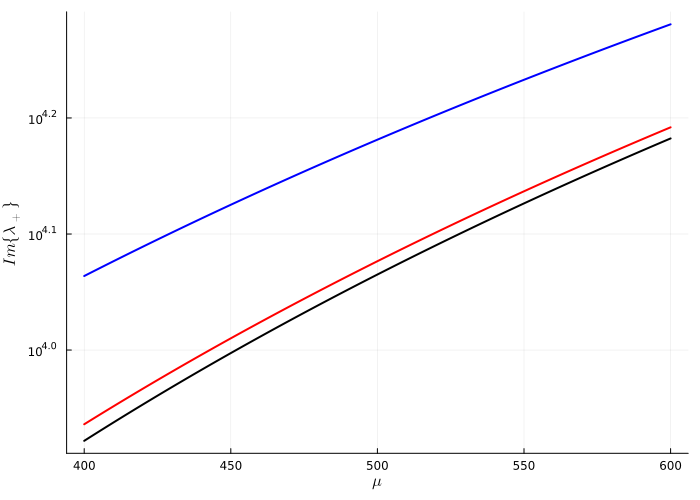

In [18]:
# plot the same as previous cell but only for μ = 500 to 600

μ = collect(range(400, 600, 1000))

μ1, λ1₊, λ1₋ = λeq(μ, 1.0, c1, b, Bond)
μ2, λ2₊, λ2₋ = λeq(μ, 10.0, c1, b, Bond)
μ3, λ3₊, λ3₋ = λeq(μ, 100, c1, b, Bond)

# plotting imaginary parts (solid lines for λ₊ and dashed lines for λ₋), log scale
plot(μ1, imag(λ1₊), label=L"m = 1", color=:black, lw=2)
plot!(μ2, imag(λ2₊), label=L"m = 10", color=:red, lw=2)   
plot!(μ3, imag(λ3₊), label=L"m = 100", color=:blue, lw=2)

ylabel!(L"Im\{\lambda_+\}")
xlabel!(L"\mu")

plot!(yaxis=:log10)
plot!(size=(700, 500))
plot!(legend=false)

# print xlims and ylims
# println("xlims: ", xlims())
# println("ylims: ", ylims())

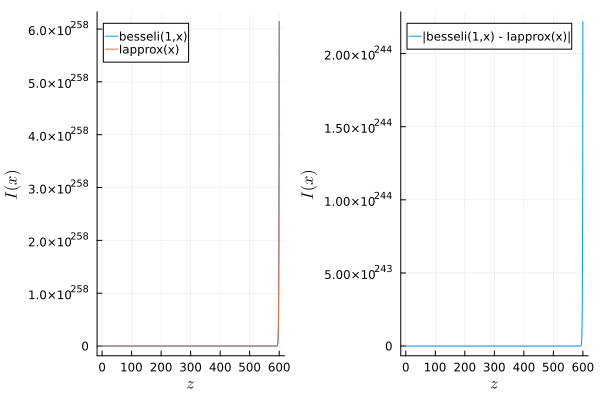

In [19]:
x = collect(range(1,600,1000))
nterms = 5

# create subplots
p1 = plot(x, besseli.(1, x), label="besseli(1,x)")
plot!(x, Iapprox(1, x, nterms), label="Iapprox(x)")

# plot the absolute difference between the two
p2 = plot(x, abs.(besseli.(1, x) .- Iapprox(1, x, nterms)), label="|besseli(1,x) - Iapprox(x)|")

# set layout to side by side
plot(p1, p2, layout=(1, 2))
plot!(xlabel=L"z", ylabel=L"I(x)")

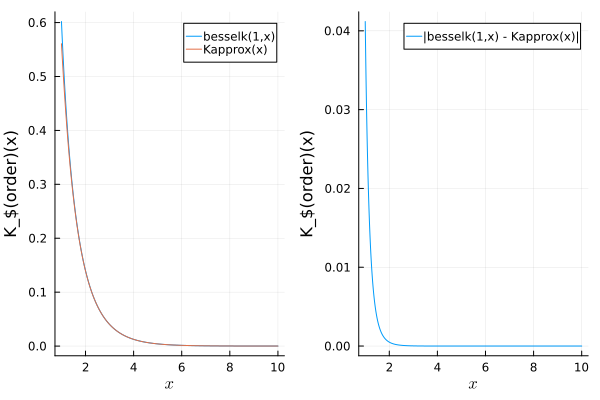

In [20]:
x = collect(range(1,10,1000))
nterms = 5
order = 1

# same as before but for besselk 
p1 = plot(x, besselk.(order, x), label="besselk(1,x)")
plot!(x, Kapprox(order, x, nterms), label="Kapprox(x)")

# plot the absolute difference between the two
p2 = plot(x, abs.(besselk.(order, x) .- Kapprox(order, x, nterms)), label="|besselk(1,x) - Kapprox(x)|")

# set layout to side by side
plot(p1, p2, layout=(1, 2))
plot!(xlabel=L"x", ylabel=L"K_$(order)(x)")

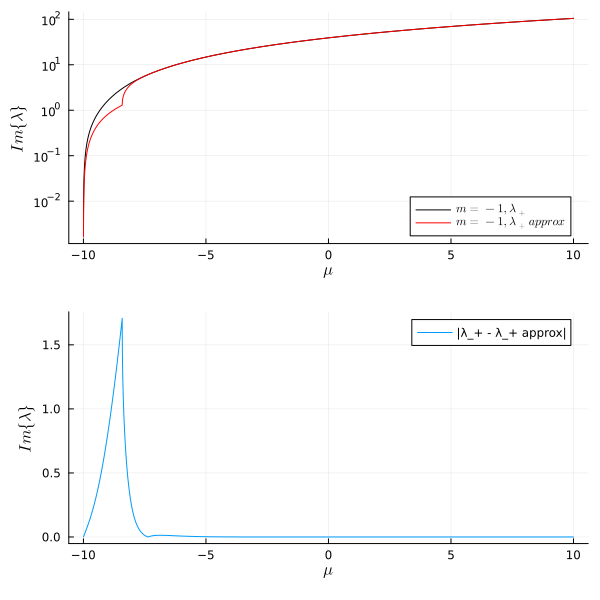

In [21]:
μ = collect(range(-10, 10, 10000))

μ1, λ1₊, λ1₋ = λeq(μ, 10, c1, b, Bond)
μ2, λ2₊, λ2₋ = λeq(μ, 10, c1, b, Bond, true)

# create subplots
p1 = plot(μ1, imag(λ1₊), label=L"m = -1, \lambda_+", color=:black, yaxis=:log10)
plot!(μ2, imag(λ2₊), label=L"m = -1, \lambda_+ approx", color=:red, yaxis=:log10)

ylabel!(L"Im\{\lambda\}")
xlabel!(L"\mu")

# plot the absolute difference between the two
p2 = plot(μ1, abs.(imag(λ1₊) .- imag(λ2₊)), label="|λ_+ - λ_+ approx|")
ylabel!(L"Im\{\lambda\}")
xlabel!(L"\mu")

# set legend position
plot!(p1, legend = :bottomright)
plot!(p2, legend = :topright)

# create subplots
plot(p1, p2, layout=(2, 1), size=(600, 600))

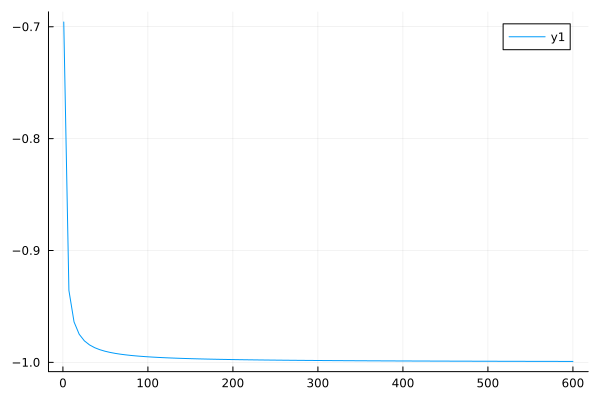

In [22]:
# plotting β0 / β1
μ = collect(range(1, 600, 100))

k = μ .+ 1
plot(μ, β(1,k,b,1) ./ β(0,k,b,1))

### Solving for collisions 

Now let's actually solve the trancendental equation for eigenvalue collisions. 

Testing the convergence by varying the number of perturbation modes for just one wave solution:

In [3]:
# import Julia solutions (best tolerance)
base = "32.1.0e-15.100.Broyden"
jsolutions = readdlm("solutions/results/$(base)/solutions_$(base).dat", Float64)
jsolution = jsolutions[50,:]; # only take one solution

In [4]:
test = solveGenEig(jsolution, 24, 1000)

# write test to a file csv
writedlm("test.csv", test, ',')

test

98×1000 Matrix{ComplexF64}:
 -1336.82+1062.21im  -1100.57+25.6091im  …  -1168.49-1085.58im
 -1010.69+210.051im  -707.861+217.844im     -1038.35+782.378im
 -787.539-858.194im  -667.473+387.763im     -424.977-71.1939im
  -452.25-343.79im   -379.355-151.949im     -386.883-433.16im
 -325.746-420.271im  -372.695-562.53im       -273.94-60.4763im
 -303.858+156.926im   -302.46-529.75im   …   -192.58+82.058im
 -154.951-60.7771im  -281.193-5409.85im     -163.395+89.0777im
 -128.507+715.231im  -215.149-393.245im     -118.561+137.356im
  -111.28-210.445im  -184.943-102.229im     -106.047-53.7786im
 -85.4963+13.4538im  -175.336+240.761im     -95.5521-37.7284im
         ⋮                               ⋱  
      NaN+NaN*im          NaN+NaN*im             NaN+NaN*im
      NaN+NaN*im          NaN+NaN*im     …       NaN+NaN*im
      NaN+NaN*im          NaN+NaN*im             NaN+NaN*im
      NaN+NaN*im          NaN+NaN*im             NaN+NaN*im
      NaN+NaN*im          NaN+NaN*im             NaN+NaN*im

In [5]:
# if there are any NaN values in test, replace them with 0 in-place
test[isnan.(test)] .= 0;

In [12]:
pretty_table(test, header = [("Real" "Imaginary"])

Base.Meta.ParseError: ParseError:
# Error @ /home/karnav/Documents/ferrofluidstabilty/analysis.ipynb:1:38
pretty_table(test, header = [("Real" "Imaginary"])
#                                    └─────────┘ ── Expected `)`

In [43]:
Nmodes = [92, 106, 112, 128]
Nmu = 1000

# compute eigenvalues λ for varying Nmodes
for Nmode in Nmodes
    sol = solveGenEig(jsolution, Nmode, Nmu)

    # if there are any NaNs, change to zero 
    sol[isnan.(sol)] .= 0
    
    # save to file
    writedlm("results/raw/convergence/$(base).$(Nmode).$(Nmu).stabSol.csv", sol, ',')
end

1000

Plot the solutions to observe their convergence:

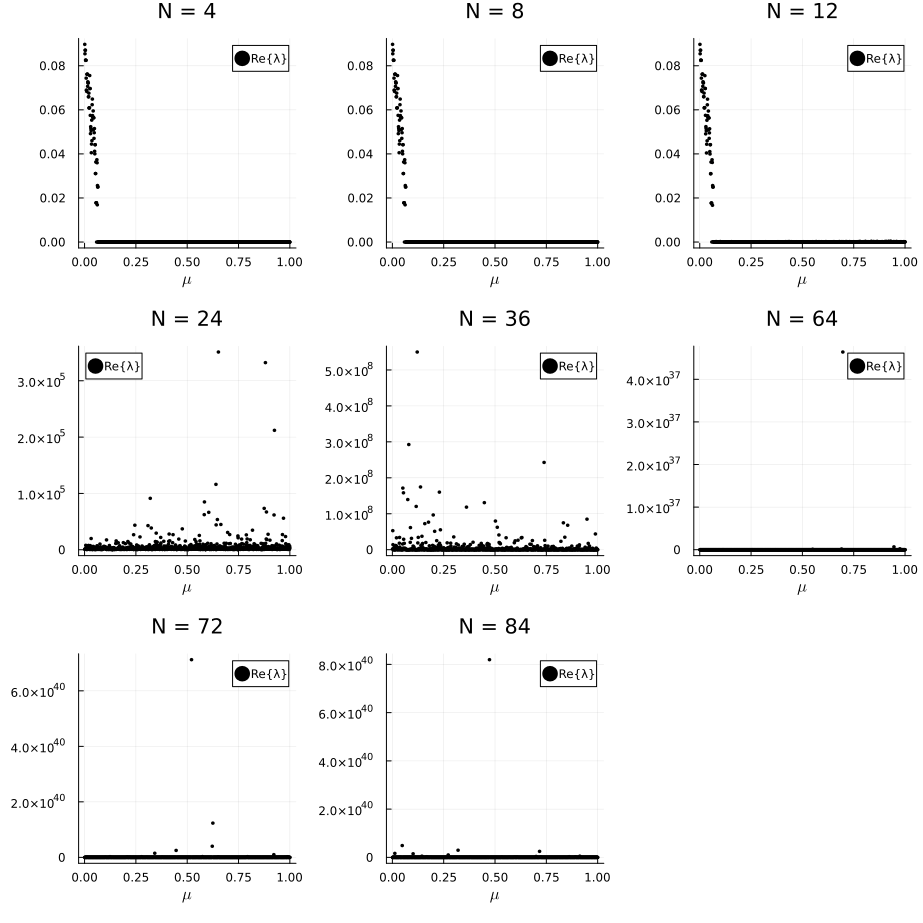

In [8]:
Nmu = 1000 

# load solutions 
sol4 = readdlm("results/raw/convergence/$(base).4.$(Nmu).stabSol.csv", ',',  Complex{Float64})
sol8 = readdlm("results/raw/convergence/$(base).8.$(Nmu).stabSol.csv", ',',  Complex{Float64})
sol12 = readdlm("results/raw/convergence/$(base).12.$(Nmu).stabSol.csv", ',',  Complex{Float64})
sol24 = readdlm("results/raw/convergence/$(base).24.$(Nmu).stabSol.csv", ',',  Complex{Float64})
sol36 = readdlm("results/raw/convergence/$(base).36.$(Nmu).stabSol.csv", ',',  Complex{Float64})
sol64 = readdlm("results/raw/convergence/$(base).64.$(Nmu).stabSol.csv", ',',  Complex{Float64})
sol72 = readdlm("results/raw/convergence/$(base).72.$(Nmu).stabSol.csv", ',',  Complex{Float64})
sol84 = readdlm("results/raw/convergence/$(base).84.$(Nmu).stabSol.csv", ',',  Complex{Float64})

# plot the eigenvalues
complexPlot4, muPlot4 = stabilityPlots(sol4, Nmu)
complexPlot8, muPlot8 = stabilityPlots(sol8, Nmu)
complexPlot12, muPlot12 = stabilityPlots(sol12, Nmu)
complexPlot24, muPlot24 = stabilityPlots(sol24, Nmu)
complexPlot36, muPlot36 = stabilityPlots(sol36, Nmu)
complexPlot64, muPlot64 = stabilityPlots(sol64, Nmu)
complexPlot72, muPlot72 = stabilityPlots(sol72, Nmu)
complexPlot84, muPlot84 = stabilityPlots(sol84, Nmu)

# plot with subplots (only the muPlots)
plot(muPlot4, muPlot8, muPlot12, muPlot24, muPlot36, muPlot64, muPlot72, muPlot84, layout=(3, 3),  size=(400*3 / 1.3, 400*3 / 1.3))

# label each subplot
plot!(title=["N = 4" "N = 8" "N = 12" "N = 24" "N = 36" "N = 64" "N = 72" "N = 84"])

Testing the `Arpack.jl` function to only compute the largest eigenvalue. 

In [12]:
# compute the largest real eigenvalues for the jsolution using the two methods
only_largest_λ = solveGenEig(jsolution, 24, 1000, largest = true)

# save to a file
writedlm("test_arpack.csv", only_largest_λ, ',');

100 out of 1000 solved
200 out of 1000 solved
300 out of 1000 solved
400 out of 1000 solved
500 out of 1000 solved
600 out of 1000 solved
700 out of 1000 solved
800 out of 1000 solved
900 out of 1000 solved
1000 out of 1000 solved


In [16]:
@time solveGenEig(jsolution, 24, 2, largest = true)

  2.211300 seconds (11.74 M allocations: 341.646 MiB, 2.13% gc time)


2-element Vector{ComplexF64}:
  17672.24025055155 + 3445.496025345594im
 28396.187777517007 - 903.3488838670564im

In [27]:
solveGenEig(jsolution, 24, 2, largest = false)

q0z = [2.0271763208789375, 2.025272487426628, 2.0196146349938804, 2.0103598934650933, 1.9977579343060778, 1.9821343044451796, 1.9638700557400959, 1.9433799354065715, 1.9210912694521858, 1.8974252443809527, 1.8727817045550001, 1.8475279700038496, 1.8219916492483585, 1.796457035624861, 1.7711644495133543, 1.7463118047680788, 1.722057700076963, 1.6985254249684545, 1.6758073902825694, 1.653969618295556, 1.6330560420947555, 1.6130924587926714, 1.594090054556874, 1.576048472605007, 1.5589584311035043, 1.5428039200763228, 1.527564018633774, 1.5132143788707002, 1.4997284231370083, 1.487078299004292, 1.4752356322180429, 1.4641721131642091, 1.4538599476149257, 1.4442721978920352, 1.4353830363153264, 1.4271679291373347, 1.4196037659365954, 1.4126689466355549, 1.4063434360658418, 1.4006087940936212, 1.3954481876775469, 1.3908463899985015, 1.3867897707621006, 1.3832662808594938, 1.3802654339383693, 1.377778286901602, 1.375797420839304, 1.3743169235891781, 1.3733323748541126, 1.3728408344998968, 1.3

98×2 Matrix{ComplexF64}:
 -1336.82+1062.21im  -1168.49-1085.58im
 -1010.69+210.051im  -1038.35+782.378im
 -787.539-858.194im  -424.977-71.1939im
  -452.25-343.79im   -386.883-433.16im
 -325.746-420.271im   -273.94-60.4763im
 -303.858+156.926im   -192.58+82.058im
 -154.951-60.7771im  -163.395+89.0777im
 -128.507+715.231im  -118.561+137.356im
  -111.28-210.445im  -106.047-53.7786im
 -85.4963+13.4538im  -95.5521-37.7284im
         ⋮           
      NaN+NaN*im          NaN+NaN*im
      NaN+NaN*im          NaN+NaN*im
      NaN+NaN*im          NaN+NaN*im
      NaN+NaN*im          NaN+NaN*im
      NaN+NaN*im          NaN+NaN*im
      NaN+NaN*im          NaN+NaN*im
      NaN+NaN*im          NaN+NaN*im
      NaN+NaN*im          NaN+NaN*im
      NaN+NaN*im          NaN+NaN*im

In [9]:
# compute the largest real λ from the test solutions
maxrealλ_test = zeros(1000)

Threads.@threads for i = 1:length(maxrealλ_test)
    maxrealλ_test[i] = maximum(real(test[:,i]))
end

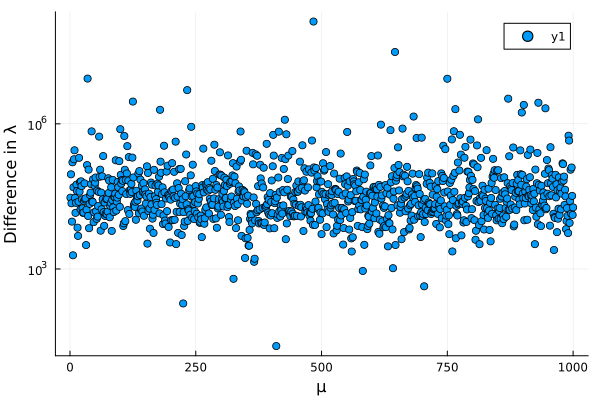

In [11]:
only_largest_λ = readdlm("test_arpack.csv", ',', Complex{Float64})
scatter(abs.(maxrealλ_test .- real(only_largest_λ)), xlabel = "μ", ylabel = "Difference in λ", yaxis = :log10)

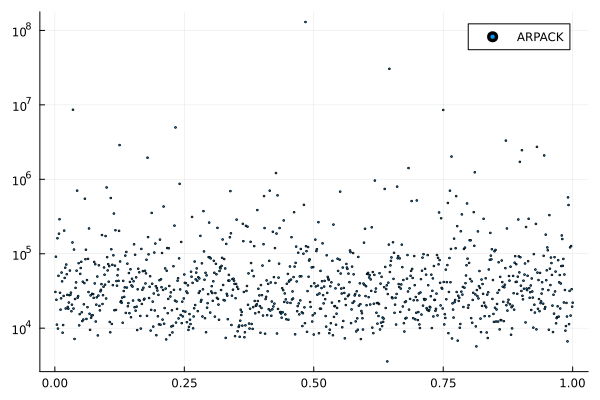

In [12]:
# plot the muPlot for the jsolution computed using the two methods

μ = collect(range(0.001,1.0,1000))

# load the solutions (and convert to a vector)
λ_arpack = real.(readdlm("test_arpack.csv", ',',  Complex{Float64})[:,1])

scatter(μ, λ_arpack, markersize=1, yaxis=:log10, label="ARPACK")

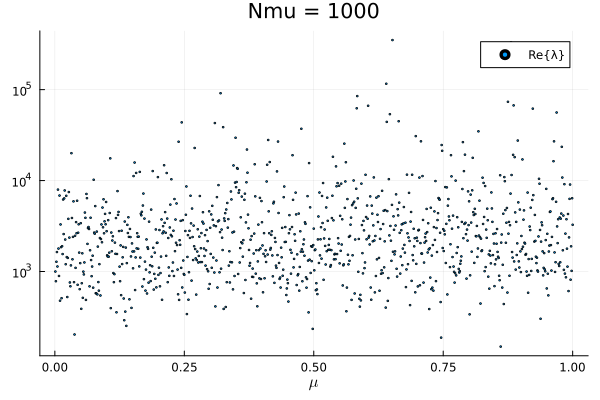

In [23]:
complexPlot24, muPlot24 = stabilityPlots(sol24, Nmu)
plot(muPlot24, yaxis=:log10)